In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/csiro-biomass/sample_submission.csv
/kaggle/input/csiro-biomass/train.csv
/kaggle/input/csiro-biomass/test.csv
/kaggle/input/csiro-biomass/test/ID1001187975.jpg
/kaggle/input/csiro-biomass/train/ID2099464826.jpg
/kaggle/input/csiro-biomass/train/ID2037861084.jpg
/kaggle/input/csiro-biomass/train/ID1211362607.jpg
/kaggle/input/csiro-biomass/train/ID1853508321.jpg
/kaggle/input/csiro-biomass/train/ID193102215.jpg
/kaggle/input/csiro-biomass/train/ID698608346.jpg
/kaggle/input/csiro-biomass/train/ID1859251563.jpg
/kaggle/input/csiro-biomass/train/ID1880764911.jpg
/kaggle/input/csiro-biomass/train/ID853954911.jpg
/kaggle/input/csiro-biomass/train/ID1403107574.jpg
/kaggle/input/csiro-biomass/train/ID1781353117.jpg
/kaggle/input/csiro-biomass/train/ID384648061.jpg
/kaggle/input/csiro-biomass/train/ID1563418511.jpg
/kaggle/input/csiro-biomass/train/ID2125100696.jpg
/kaggle/input/csiro-biomass/train/ID482555369.jpg
/kaggle/input/csiro-biomass/train/ID638711343.jpg
/kaggle/input/c

In [2]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf

print("TensorFlow:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2025-11-30 01:09:16.823535: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764464956.844994     573 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764464956.851608     573 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

TensorFlow: 2.18.0
Num GPUs Available:  2


In [3]:
PATH = "/kaggle/input/csiro-biomass/"
df = pd.read_csv(PATH + "/train.csv")
pivot_df = df.pivot_table(index='image_path', columns='target_name', values='target').reset_index()

target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
pivot_df = pivot_df[['image_path'] + target_cols]

# train_df, val_df = train_test_split(pivot_df, test_size=0.15, random_state=42)

In [4]:
def normalize(y):
    return tf.math.log1p(y)

def denormalize(y):
    return tf.math.expm1(y)


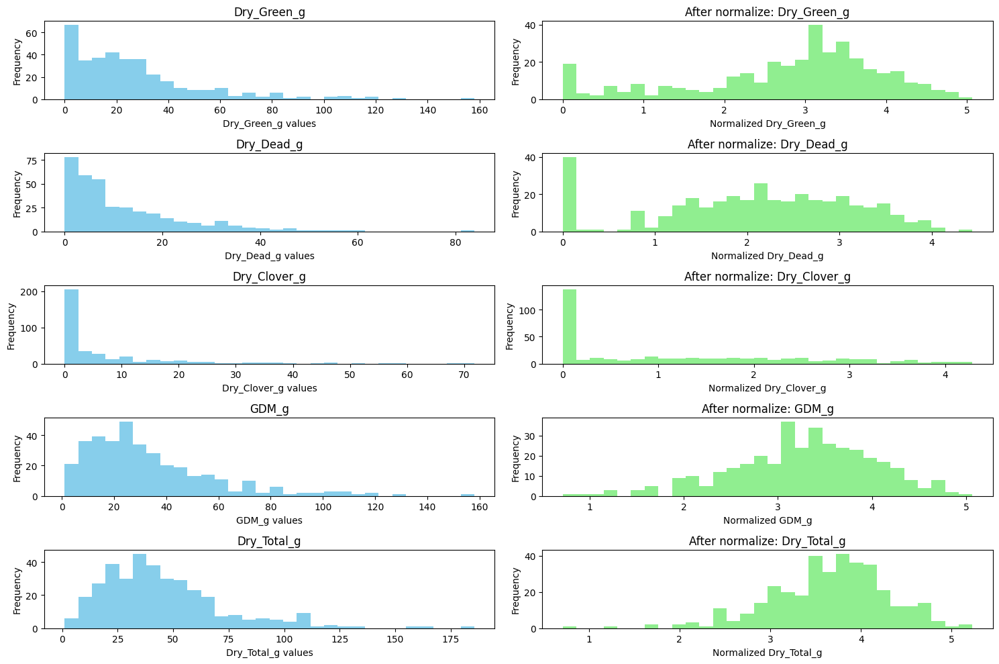

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

x_norm = np.log1p(pivot_df[target_cols])

# Plot histograms for each feature before and after normalization
plt.figure(figsize=(15,10))

for i, col in enumerate(target_cols):
    plt.subplot(5, 2, 2*i + 1)
    plt.hist(pivot_df[col], bins=30, color='skyblue')
    plt.title(f"{col}")
    plt.xlabel(f"{col} values")
    plt.ylabel("Frequency")

    plt.subplot(5, 2, 2*i + 2)
    plt.hist(x_norm[col], bins=30, color='lightgreen')
    plt.title(f"After normalize: {col}")
    plt.xlabel(f"Normalized {col}")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


In [6]:
IMG_SIZE = 768

import tensorflow as tf

# LAB conversion helper
def rgb_to_lab(image):
    # Convert RGB to XYZ
    rgb = image

    # sRGB to linear RGB
    mask = tf.cast(rgb > 0.04045, tf.float32)
    linear_rgb = (rgb / 12.92) * (1 - mask) + tf.pow((rgb + 0.055) / 1.055, 2.4) * mask

    # RGB → XYZ matrix
    M = tf.constant([[0.412453, 0.357580, 0.180423],
                     [0.212671, 0.715160, 0.072169],
                     [0.019334, 0.119193, 0.950227]], tf.float32)

    xyz = tf.tensordot(linear_rgb, M, axes=1)

    # Normalize for D65 white point
    xyz_norm = xyz / tf.constant([0.95047, 1.00000, 1.08883])

    # XYZ → LAB
    epsilon = 0.008856
    kappa   = 903.3

    def f(t):
        return tf.where(t > epsilon, tf.pow(t, 1/3), (kappa * t + 16) / 116)

    f_xyz = f(xyz_norm)

    L = 116 * f_xyz[...,1] - 16
    a = 500 * (f_xyz[...,0] - f_xyz[...,1])
    b = 200 * (f_xyz[...,1] - f_xyz[...,2])

    # Normalize LAB to [0,1]
    L = L / 100.0
    a = (a + 128) / 255.0
    b = (b + 128) / 255.0

    lab = tf.stack([L, a, b], axis=-1)
    return lab


def load_image(path):
    # Read and resize
    img = tf.io.read_file(PATH + "/" + path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32) / 255.0      # RGB (3)

    # --- COLOR SPACES ---
    hsv = tf.image.rgb_to_hsv(img)              # HSV (3)
    lab = rgb_to_lab(img)                       # LAB (3)

    # --- VEGETATION INDICES ---
    r, g, b = img[...,0], img[...,1], img[...,2]

    exg = 2*g - r - b
    exg = tf.expand_dims(exg, -1)

    vari = (g - r) / (g + r - b + 1e-6)
    vari = tf.expand_dims(vari, -1)

    # ---- STACK EVERYTHING (11 channels) ----
    out = tf.concat([img, hsv, lab, exg, vari], axis=-1)

    # ---- CLEAN BAD VALUES ----
    out = tf.where(tf.math.is_nan(out), 0.0, out)
    out = tf.where(tf.math.is_inf(out), 0.0, out)

    return out


Plotting: train/ID13162390.jpg


I0000 00:00:1764464963.507196     573 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1764464963.507852     573 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


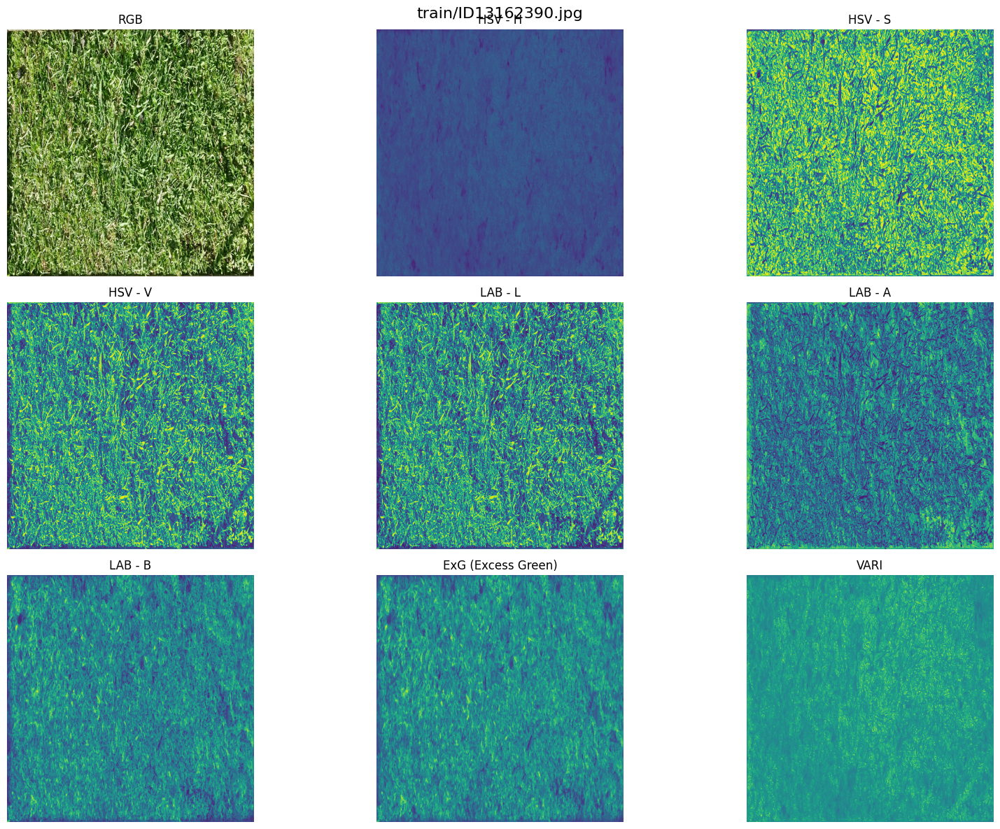

Plotting: train/ID325799913.jpg


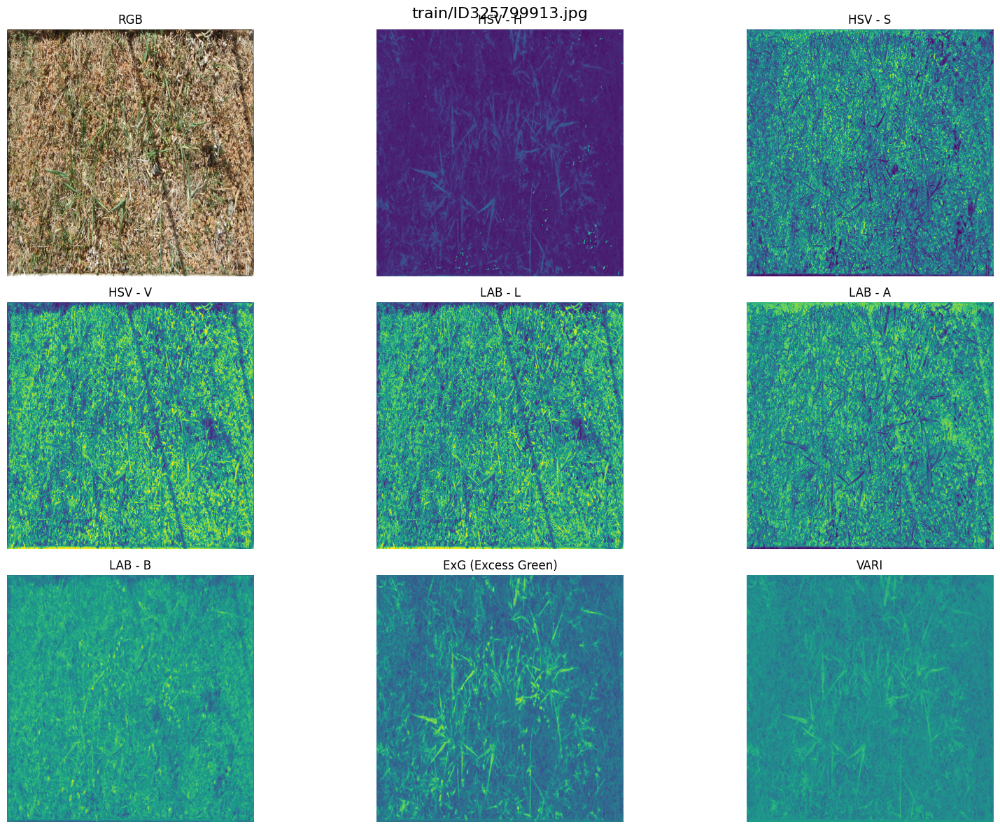

Plotting: train/ID1963715583.jpg


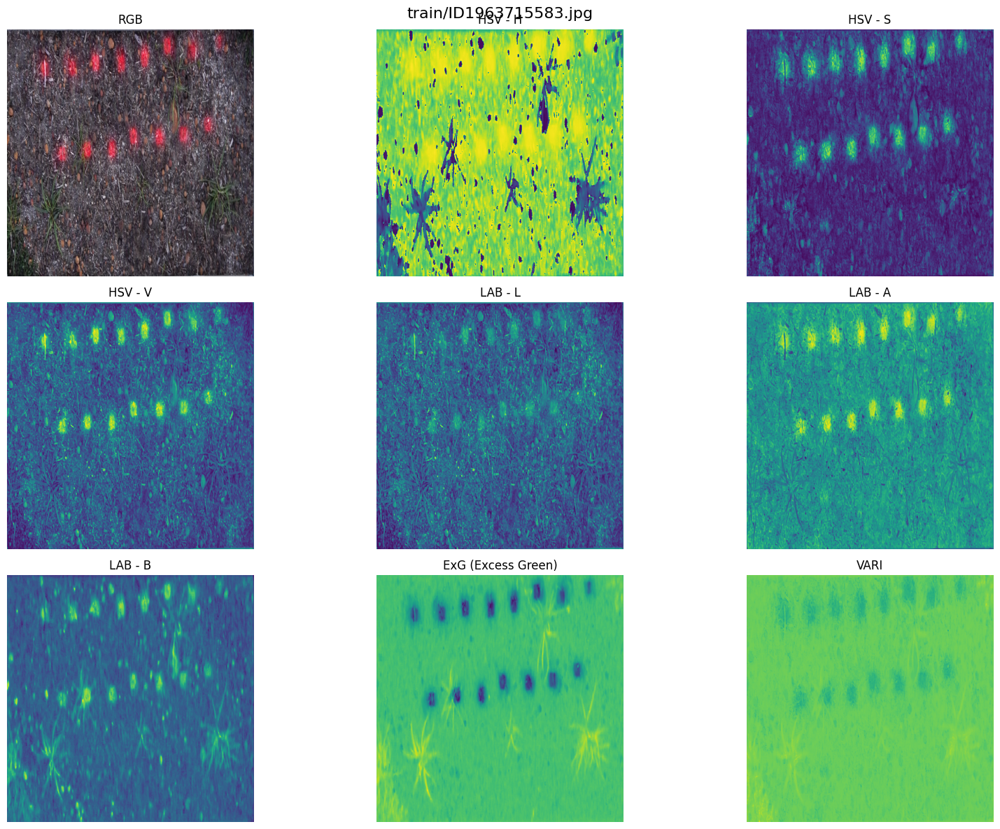

In [7]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

N_SAMPLES = 3  # choose how many images to preview
sample_paths = pivot_df['image_path'].sample(N_SAMPLES).tolist()


def plot_features(img_tensor, title=""):
    """
    img_tensor: output of load_image() → shape (H, W, 11)
    """

    img = img_tensor.numpy()

    # Extract channels (matching load_image)
    RGB  = img[..., :3]

    HSV  = img[..., 3:6]
    LAB  = img[..., 6:9]

    EXG  = img[..., 9]
    VARI = img[..., 10]

    # order matters for visual clarity
    feature_maps = [
        ("RGB", RGB),

        ("HSV - H", HSV[...,0]),
        ("HSV - S", HSV[...,1]),
        ("HSV - V", HSV[...,2]),

        ("LAB - L", LAB[...,0]),
        ("LAB - A", LAB[...,1]),
        ("LAB - B", LAB[...,2]),

        ("ExG (Excess Green)", EXG),
        ("VARI", VARI),
    ]

    plt.figure(figsize=(16, 20))
    plt.suptitle(title, fontsize=16)

    for i, (name, channel) in enumerate(feature_maps, 1):
        plt.subplot(5, 3, i)

        if channel.ndim == 3:     # RGB
            plt.imshow(channel)
        else:
            plt.imshow(channel, cmap="viridis")

        plt.title(name)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# ---- RUN VISUALIZATION ----
for path in sample_paths:
    print("Plotting:", path)
    img_tensor = load_image(path)
    plot_features(img_tensor, title=path)


In [8]:
# =============================
#  Dataset Pipeline – Final
# =============================

IMG_SIZE = 768
BATCH_SIZE = 4

# Normalization function (log1p)
def normalize_targets(y):
    return tf.math.log1p(y)

def create_dataset(dataframe, batch_size=BATCH_SIZE, shuffle=False):
    # Ensure image paths are strings
    image_paths = dataframe['image_path'].astype(str).values

    # Extract raw targets (already pivoted)
    targets = dataframe[target_cols].values.astype(np.float32)

    # Create TF dataset
    ds = tf.data.Dataset.from_tensor_slices((image_paths, targets))

    # Mapping: image features + normalized targets
    def map_func(path, target):
        img = load_image(path)             # 11-channel feature extraction
        y   = normalize_targets(target)    # apply log1p normalization
        return img, y

    ds = ds.map(map_func, num_parallel_calls=tf.data.AUTOTUNE)

    # Shuffle only for training
    if shuffle:
        ds = ds.shuffle(buffer_size=len(dataframe), reshuffle_each_iteration=True)

    # Batch + prefetch for performance
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return ds


# =============================
#  Train / Validation Split
# =============================
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    pivot_df,
    test_size=0.15,
    random_state=42,
)

train_ds = create_dataset(train_df, shuffle=True)
val_ds   = create_dataset(val_df, shuffle=False)

train_ds, val_ds


(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 768, 768, 11), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 768, 768, 11), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.float32, name=None))>)

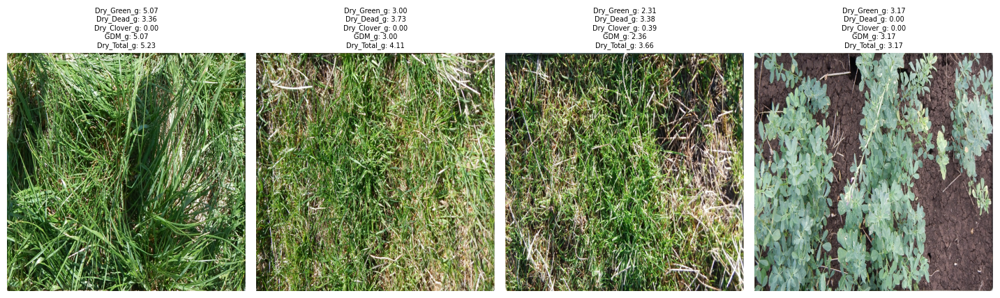

In [9]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(18, 5))

for images, targets in train_ds.take(1):
    for i in range(4):  # show 5 images
        ax = plt.subplot(1, 5, i + 1)
        
        # Convert ONLY RGB channels for display
        rgb = images[i][..., :3].numpy()
        plt.imshow(rgb)
        
        # Targets (currently normalized via log1p)
        t = targets[i].numpy()
        
        # OPTIONAL: convert back to original biomass values
        # Uncomment if you want actual grams:
        # t = np.expm1(t)
        
        # Create title string
        title_str = "\n".join([f"{n}: {v:.2f}" for n, v in zip(target_cols, t)])
        
        plt.title(title_str, fontsize=7)
        plt.axis("off")

plt.tight_layout()
plt.show()


In [10]:
from tensorflow.keras.applications import ConvNeXtTiny
from tensorflow.keras import layers, Model, Input

def build_model(input_shape=(768, 768, 11), n_outputs=5):
    inp = Input(shape=input_shape)


    x = layers.Conv2D(96, 4, strides=4, padding="same",name="custom_stem_conv")(inp)

    base = ConvNeXtTiny(include_top=False, weights="imagenet")

    backbone_input = x

    for layer in base.layers[3:]:
        backbone_input = layer(backbone_input)

    x = backbone_input

    x = layers.GlobalAveragePooling2D()(x)


    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.2)(x)

    out = layers.Dense(n_outputs, activation="linear")(x)

    model = Model(inp, out, name="ConvNeXt_11ch_5out")

    return model


model = build_model()
model.summary()


Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 28,062,629 (107.05 MB)

 Trainable params: 28,062,629 (107.05 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
# Freeze all ConvNeXt layers (only train custom stem + head)
for layer in model.layers:
    if "convnext" in layer.name:   # all ConvNeXt layers
        layer.trainable = False

model.summary()

Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 28,062,629 (107.05 MB)

 Trainable params: 248,933 (972.39 KB)

 Non-trainable params: 27,813,696 (106.10 MB)

In [12]:
import tensorflow as tf
import tensorflow.keras.backend as K

# Weighted R2 metric
def weighted_r2(y_true, y_pred):
    weights = tf.constant([0.1, 0.1, 0.1, 0.2, 0.5], dtype=tf.float32)
    mean_y_true = K.mean(y_true, axis=0)
    tss = K.sum(K.square(y_true - mean_y_true), axis=0)
    rss = K.sum(K.square(y_true - y_pred), axis=0)
    r2_scores = 1 - rss / (tss + K.epsilon())
    return K.sum(r2_scores * weights)

# Per-target MAEs
def mae_0(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,0] - y_pred[:,0]))
def mae_1(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,1] - y_pred[:,1]))
def mae_2(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,2] - y_pred[:,2]))
def mae_3(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,3] - y_pred[:,3]))
def mae_4(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,4] - y_pred[:,4]))

In [13]:
optimizer_warmup = tf.keras.optimizers.Adam(
    learning_rate=3e-5,
    clipnorm=1.0
)

model.compile(
    optimizer=optimizer_warmup,
    loss=tf.keras.losses.Huber(delta=1.0),
    metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4, weighted_r2]
)


In [14]:
history_warmup = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=3,
    verbose=1
)


Epoch 1/3


I0000 00:00:1764465041.917219     627 service.cc:148] XLA service 0x790f0c010d50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764465041.917268     627 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1764465041.917275     627 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1764465043.469315     627 cuda_dnn.cc:529] Loaded cuDNN version 90300
E0000 00:00:1764465045.322921     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465045.464787     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465045.731013     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. Th

75/76 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - loss: 1.5831 - mae: 2.0389 - mae_0: 3.4244 - mae_1: 1.9351 - mae_2: 1.4414 - mae_3: 1.4290 - mae_4: 1.9644 - weighted_r2: -42255.3984

E0000 00:00:1764465085.970562     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465086.110030     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465086.333155     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465086.469697     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465087.896595     627 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - loss: 1.5783 - mae: 2.0338 - mae_0: 3.4154 - mae_1: 1.9320 - mae_2: 1.4385 - mae_3: 1.4254 - mae_4: 1.9574 - weighted_r2: -42260.1406

E0000 00:00:1764465105.500499     628 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465105.638824     628 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465105.847144     628 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465105.983387     628 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


76/76 ━━━━━━━━━━━━━━━━━━━━ 105s 701ms/step - loss: 1.5736 - mae: 2.0288 - mae_0: 3.4067 - mae_1: 1.9290 - mae_2: 1.4357 - mae_3: 1.4219 - mae_4: 1.9506 - weighted_r2: -42264.7578 - val_loss: 0.5663 - val_mae: 0.9669 - val_mae_0: 1.1701 - val_mae_1: 1.1886 - val_mae_2: 1.2333 - val_mae_3: 0.6331 - val_mae_4: 0.5668 - val_weighted_r2: -1.3395
Epoch 2/3
76/76 ━━━━━━━━━━━━━━━━━━━━ 64s 450ms/step - loss: 0.6429 - mae: 1.0399 - mae_0: 1.1473 - mae_1: 1.0988 - mae_2: 1.2284 - mae_3: 0.8700 - mae_4: 0.8551 - weighted_r2: -87418.4609 - val_loss: 0.4808 - val_mae: 0.8707 - val_mae_0: 1.0160 - val_mae_1: 0.9518 - val_mae_2: 1.1848 - val_mae_3: 0.6606 - val_mae_4: 0.5263 - val_weighted_r2: -1.2717
Epoch 3/3
76/76 ━━━━━━━━━━━━━━━━━━━━ 63s 452ms/step - loss: 0.5793 - mae: 0.9664 - mae_0: 1.0100 - mae_1: 1.0831 - mae_2: 1.1190 - mae_3: 0.8242 - mae_4: 0.7959 - weighted_r2: -37763.8086 - val_loss: 0.4696 - val_mae: 0.8518 - val_mae_0: 0.9894 - val_mae_1: 0.9512 - val_mae_2: 1.1851 - val_mae_3: 0.6259 

In [15]:
# Unfreeze everything
for layer in model.layers:
    layer.trainable = True

model.summary()

Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 28,560,497 (108.95 MB)

 Trainable params: 28,062,629 (107.05 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 497,868 (1.90 MB)

In [16]:
optimizer_full = tf.keras.optimizers.Adam(
    learning_rate=5e-6,
    clipnorm=1.0
)

model.compile(
    optimizer=optimizer_full,
    loss=tf.keras.losses.Huber(delta=1.0),
    metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4, weighted_r2]
)


In [17]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'best_model.keras',
    monitor='val_weighted_r2',
    mode='max',
    save_best_only=True,
    verbose=1
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_weighted_r2',
    mode='max',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_weighted_r2',
    mode='max',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)


In [18]:
history_full = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=1,
    callbacks=[checkpoint, reduce_lr],
    # callbacks=[checkpoint, reduce_lr, early_stopping],
    verbose=1
)


E0000 00:00:1764465303.558661     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465303.699242     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465304.019858     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465304.155743     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


75/76 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.5902 - mae: 0.9834 - mae_0: 1.1633 - mae_1: 0.9479 - mae_2: 1.1162 - mae_3: 0.8393 - mae_4: 0.8504 - weighted_r2: -16453.5918

E0000 00:00:1764465378.751226     626 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465378.890096     626 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465379.190935     626 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764465379.326667     626 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 992ms/step - loss: 0.5901 - mae: 0.9833 - mae_0: 1.1627 - mae_1: 0.9479 - mae_2: 1.1171 - mae_3: 0.8390 - mae_4: 0.8499 - weighted_r2: -17919.8457
Epoch 1: val_weighted_r2 improved from -inf to -1.11297, saving model to best_model.keras
76/76 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - loss: 0.5900 - mae: 0.9832 - mae_0: 1.1622 - mae_1: 0.9478 - mae_2: 1.1180 - mae_3: 0.8387 - mae_4: 0.8495 - weighted_r2: -19348.0137 - val_loss: 0.4736 - val_mae: 0.8676 - val_mae_0: 0.9606 - val_mae_1: 0.9503 - val_mae_2: 1.2276 - val_mae_3: 0.6492 - val_mae_4: 0.5260 - val_weighted_r2: -1.1130 - learning_rate: 5.0000e-06


In [19]:
history_full = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=45,
    callbacks=[checkpoint, reduce_lr],
    # callbacks=[checkpoint, reduce_lr, early_stopping],
    verbose=1
)


Epoch 1/45
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 659ms/step - loss: 0.5652 - mae: 0.9516 - mae_0: 1.0428 - mae_1: 0.9997 - mae_2: 1.1472 - mae_3: 0.7692 - mae_4: 0.7989 - weighted_r2: -167604.2031
Epoch 1: val_weighted_r2 improved from -1.11297 to -0.78126, saving model to best_model.keras
76/76 ━━━━━━━━━━━━━━━━━━━━ 87s 754ms/step - loss: 0.5651 - mae: 0.9514 - mae_0: 1.0429 - mae_1: 0.9994 - mae_2: 1.1466 - mae_3: 0.7696 - mae_4: 0.7987 - weighted_r2: -166576.4219 - val_loss: 0.4495 - val_mae: 0.8225 - val_mae_0: 0.9244 - val_mae_1: 0.9402 - val_mae_2: 1.2116 - val_mae_3: 0.5679 - val_mae_4: 0.4518 - val_weighted_r2: -0.7813 - learning_rate: 5.0000e-06
Epoch 2/45
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 668ms/step - loss: 0.5335 - mae: 0.9147 - mae_0: 1.0656 - mae_1: 0.9477 - mae_2: 1.1287 - mae_3: 0.7332 - mae_4: 0.6983 - weighted_r2: -31796.6152
Epoch 2: val_weighted_r2 did not improve from -0.78126
76/76 ━━━━━━━━━━━━━━━━━━━━ 86s 744ms/step - loss: 0.5335 - mae: 0.9146 - mae_0: 1.0650 - mae_1: 0.9480 

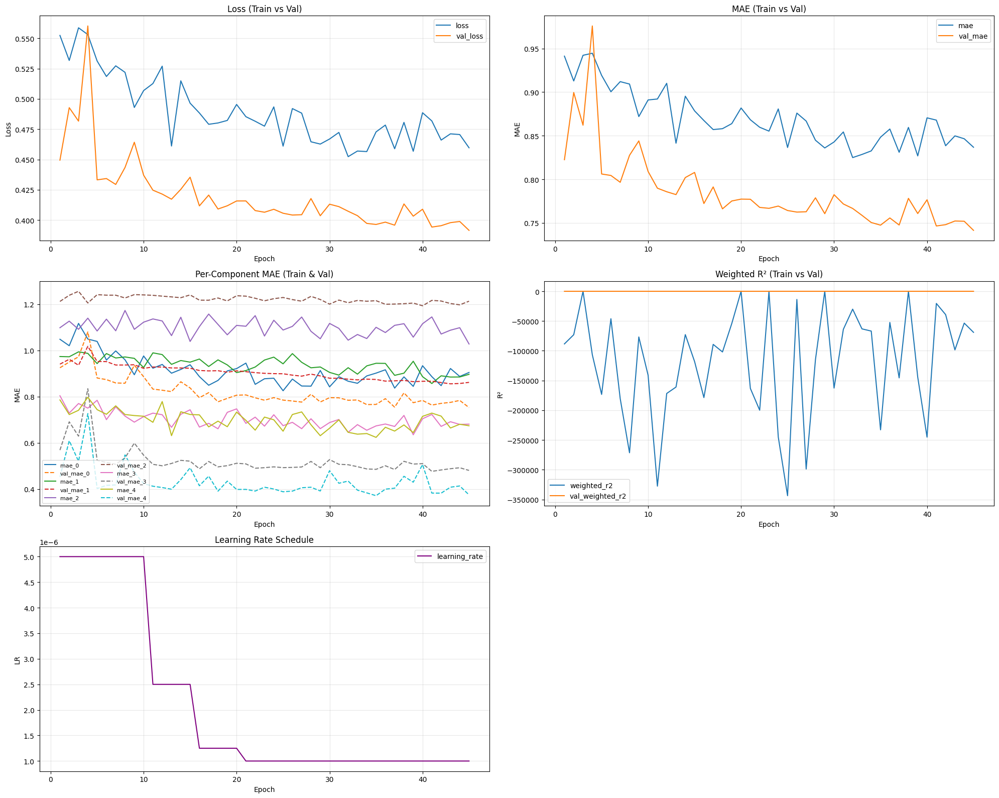

In [20]:
import matplotlib.pyplot as plt

def plot_pretty(history):
    h = history.history
    epochs = range(1, len(h['loss']) + 1)

    plt.figure(figsize=(20, 16))

    # -------------------------------
    # 1. LOSS (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 1)
    plt.plot(epochs, h['loss'], label='loss')
    plt.plot(epochs, h['val_loss'], label='val_loss')
    plt.title("Loss (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 2. MAE (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 2)
    plt.plot(epochs, h['mae'], label='mae')
    plt.plot(epochs, h['val_mae'], label='val_mae')
    plt.title("MAE (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("MAE")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 3. Per-Component MAE
    # -------------------------------
    plt.subplot(3, 2, 3)
    for i in range(5):
        plt.plot(epochs, h[f'mae_{i}'], label=f'mae_{i}')
        plt.plot(epochs, h[f'val_mae_{i}'], '--', label=f'val_mae_{i}')
    plt.title("Per-Component MAE (Train & Val)")
    plt.xlabel("Epoch")
    plt.ylabel("MAE")
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=8, ncol=2)

    # -------------------------------
    # 4. Weighted R2 (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 4)
    plt.plot(epochs, h['weighted_r2'], label='weighted_r2')
    plt.plot(epochs, h['val_weighted_r2'], label='val_weighted_r2')
    plt.title("Weighted R² (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("R²")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 5. Learning Rate Schedule
    # -------------------------------
    if 'learning_rate' in h:
        plt.subplot(3, 2, 5)
        plt.plot(epochs, h['learning_rate'], label='learning_rate', color='purple')
        plt.title("Learning Rate Schedule")
        plt.xlabel("Epoch")
        plt.ylabel("LR")
        plt.grid(True, alpha=0.3)
        plt.legend()

    plt.tight_layout()
    plt.show()
plot_pretty(history_full)

In [21]:
# from tensorflow.keras.models import load_model

# model = load_model(
#     "/home/vector/project/CSIRO---Image2Biomass-Prediction/model9.keras",
#     custom_objects={
#         "weighted_r2": weighted_r2,
#         "mae_0": mae_0,
#         "mae_1": mae_1,
#         "mae_2": mae_2,
#         "mae_3": mae_3,
#         "mae_4": mae_4,
#     }
# )

# print("Model loaded successfully!")


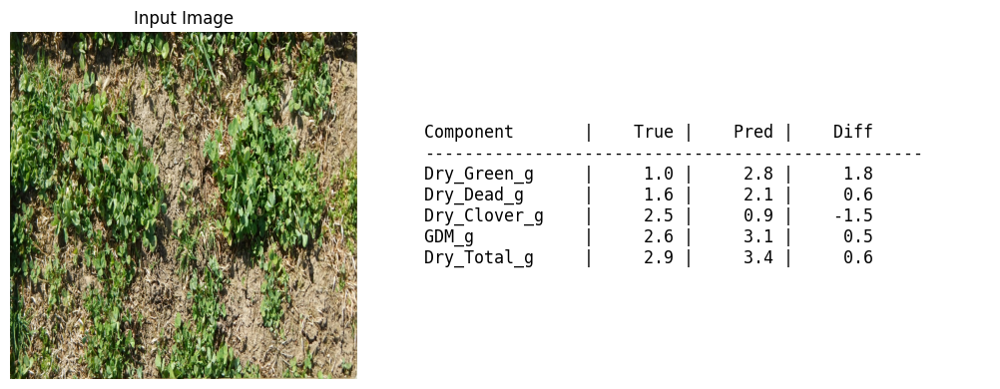

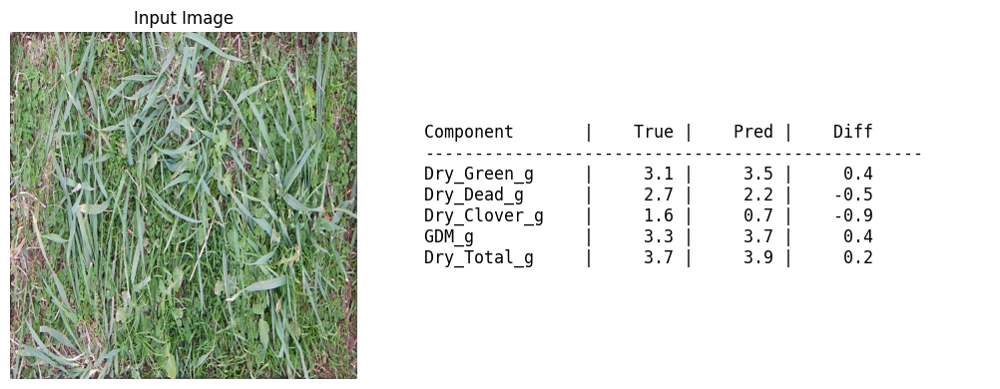

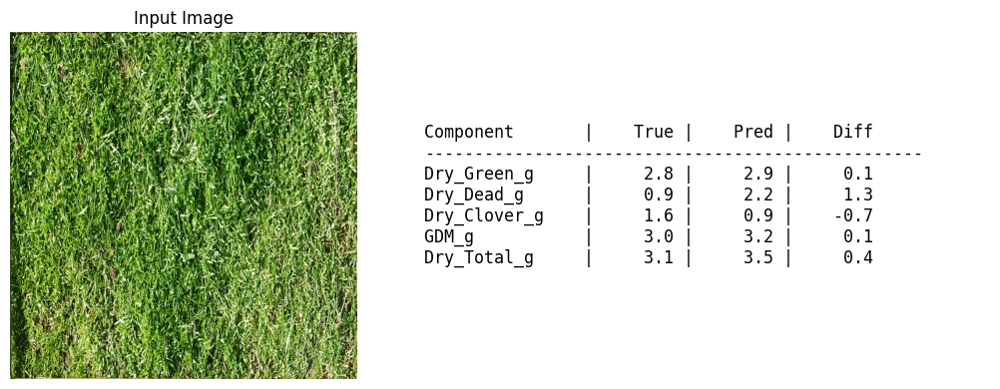

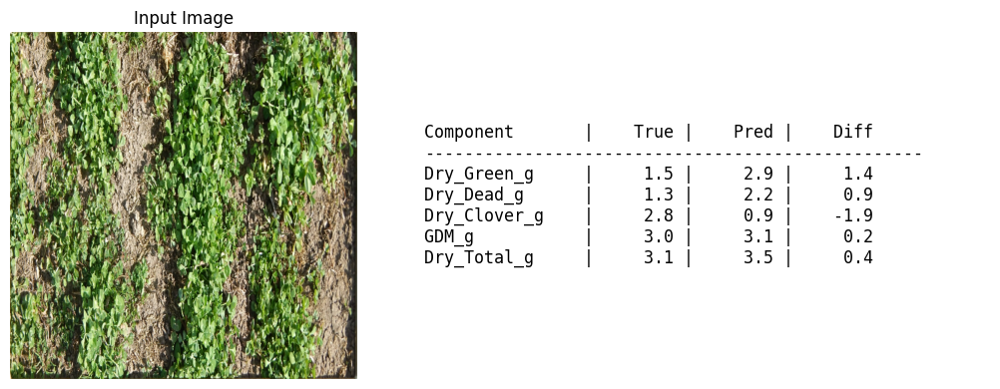

In [22]:
import matplotlib.pyplot as plt
import numpy as np

def evaluate_and_visualize_rgb(model, val_ds, num_samples=4):
    # Storage
    all_images = []
    all_targets = []
    all_preds = []

    print("Collecting predictions...")
    for images, targets in val_ds:
        preds = model.predict(images, verbose=0)
        images = images.numpy()

        # KEEP ONLY FIRST 3 CHANNELS (RGB)
        images = images[..., :3]

        # CLIP image to valid range
        images = np.clip(images, 0, 1)

        all_images.append(images)
        all_targets.append(targets.numpy())
        all_preds.append(preds)

    # Combine batches
    all_images = np.concatenate(all_images, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    all_preds = np.concatenate(all_preds, axis=0)

    # Component names
    target_names = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']

    # Randomly pick samples
    idxs = np.random.choice(len(all_images), num_samples, replace=False)

    for idx in idxs:
        img = all_images[idx]
        true = all_targets[idx]
        pred = all_preds[idx]

        plt.figure(figsize=(12,4))

        # -------------------
        # LEFT: Image
        # -------------------
        plt.subplot(1,2,1)
        plt.imshow(img)
        plt.axis("off")
        plt.title("Input Image")

        # -------------------
        # RIGHT: Prediction Table
        # -------------------
        plt.subplot(1,2,2)
        plt.axis("off")

        text = f"{'Component':<15} | {'True':>7} | {'Pred':>7} | {'Diff':>7}\n"
        text += "-"*50 + "\n"

        for i, name in enumerate(target_names):
            diff = pred[i] - true[i]
            text += f"{name:<15} | {true[i]:7.1f} | {pred[i]:7.1f} | {diff:7.1f}\n"

        plt.text(0, 0.5, text, fontsize=12, family="monospace", va="center")
        plt.tight_layout()
        plt.show()

evaluate_and_visualize_rgb(model, val_ds, num_samples=4)


In [23]:
# ---------------------------
# Build test dataset (reuse load_image)
# ---------------------------
import pandas as pd
import numpy as np
import tensorflow as tf

# Read test.csv (reuse PATH variable)
test_df = pd.read_csv(PATH + "/test.csv")
unique_images = test_df["image_path"].unique()
print(f"Found {len(unique_images)} unique test images.")

# Create a tf.data dataset that returns only images (no targets)
test_ds = (
    tf.data.Dataset.from_tensor_slices(unique_images.astype(str))
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)   # reuse your exact load_image()
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

# ---------------------------
# Predict (model must expect same 11-channel input)
# ---------------------------
print("Running model.predict on test_ds ...")
preds_norm = model.predict(test_ds, verbose=1)   # predictions in normalized (log1p) space
print("Predictions shape:", preds_norm.shape)

# ---------------------------
# De-normalize predictions -> grams
# ---------------------------
# Reuse your denormalize function (tf.math.expm1) to be consistent.
# Convert preds_norm -> tensor -> denormalize -> numpy
preds_denorm = denormalize(tf.constant(preds_norm, dtype=tf.float32)).numpy()  # shape (N_images, 5)
print("De-normalized predictions (first row):", preds_denorm[0])

# ---------------------------
# Build lookup: image_path -> {target_name: value}
# ---------------------------
pred_dict = {
    img_path: {col: float(val) for col, val in zip(target_cols, pred_row)}
    for img_path, pred_row in zip(unique_images, preds_denorm)
}

# ---------------------------
# Create submission rows in the SAME order as test.csv
# ---------------------------
rows = []
for _, row in test_df.iterrows():
    img = row["image_path"]
    target = row["target_name"]
    sample_id = row["sample_id"]

    # fetch prediction and clamp non-negative
    pred_val = float(pred_dict[img][target])
    pred_val = max(0.0, pred_val)

    rows.append({"sample_id": sample_id, "target": pred_val})

submission_df = pd.DataFrame(rows)

# Save CSV
out_path = "submission.csv"
submission_df.to_csv(out_path, index=False)
print(f"\nSaved submission to {out_path}")
print(submission_df.head())


Found 1 unique test images.
Running model.predict on test_ds ...


E0000 00:00:1764469346.533397     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764469346.669045     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764469346.855870     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1764469346.989613     629 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Predictions shape: (1, 5)
De-normalized predictions (first row): [10.607742   6.5976424  1.734923  16.164734  22.743834 ]

Saved submission to submission.csv
                    sample_id     target
0  ID1001187975__Dry_Clover_g   1.734923
1    ID1001187975__Dry_Dead_g   6.597642
2   ID1001187975__Dry_Green_g  10.607742
3   ID1001187975__Dry_Total_g  22.743834
4         ID1001187975__GDM_g  16.164734
